In [1]:
# Data manipulation
import pandas as pd
import numpy as np
import xarray as xr
import netCDF4 as nc

# Graphic
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.basemap import shiftgrid
import matplotlib.dates as mdates
import seaborn as sns
from cartopy.crs import EqualEarth, PlateCarree
import geopandas as gpd
from shapely.geometry import Point

# PCA/EOF Analysis
from xeofs.models import EOF, EOFRotator, ExtendedEOF

# Statistics
from scipy import stats
from scipy.interpolate import griddata

In [2]:
def modes_to_pandas(rscores, rcomponents, n_modes):
    eof_temporal_data = pd.DataFrame()
    for i in range(1, n_modes+1):
        eof_aux = rscores.sel(mode=i).to_dataframe().reset_index()
        eof_temporal_data = pd.concat([eof_temporal_data, eof_aux])
        del eof_aux
    eof_temporal_data = eof_temporal_data.reset_index(drop=True)

    eof_spatial_data = pd.DataFrame()
    for i in range(1, n_modes+1):
        eof_aux = rcomponents.sel(mode=i).to_dataframe().reset_index()
        eof_aux.insert(3, 'lon_reshape', eof_aux.apply(lambda x: ((x.lon+180) % 360) - 180, axis=1))
        eof_spatial_data = pd.concat([eof_spatial_data, eof_aux])
        del eof_aux
    eof_spatial_data = eof_spatial_data.reset_index(drop=True)


    return eof_temporal_data, eof_spatial_data

<br>
<br>
<br>
<br>
<br>
<br>

# SST anomaly EOF analysis

NOAA ERSST Reanalysis Dataset V5: https://downloads.psl.noaa.gov/Datasets/noaa.ersst.v5/

In [3]:
fp = '../data/sst.mnmean.nc'
sst = xr.open_dataset(fp)

Remove climatologies (obtain anomalies series): https://xeofs.readthedocs.io/en/latest/auto_examples/1single/plot_eeof_trend.html#sphx-glr-auto-examples-1single-plot-eeof-trend-py

In [4]:
anomaly_sst = sst['sst']
anomaly_sst = anomaly_sst.groupby("time.month") - anomaly_sst.groupby("time.month").mean("time")

In [5]:
eof_model_detrended = EOF(n_modes=20, standardize=False, use_coslat=True)
eof_model_detrended.fit(anomaly_sst, dim="time")

# VARIMAX rotation
rotator = EOFRotator(n_modes=20)
rotator.fit(eof_model_detrended)
expvar = rotator.explained_variance()
expvar_ratio = rotator.explained_variance_ratio()
rcomponents = rotator.components()
rscores = rotator.scores()

In [6]:
print("Explained variance: ", expvar.round(0).values)
print("\nRelative: ", (expvar_ratio * 100).round(1).values)

Explained variance:  [358. 288. 191. 128.  91.  77.  76.  73.  72.  67.  64.  63.  62.  59.
  58.  57.  56.  53.  52.  49.]

Relative:  [10.7  8.6  5.7  3.8  2.7  2.3  2.3  2.2  2.2  2.   1.9  1.9  1.8  1.8
  1.7  1.7  1.7  1.6  1.5  1.5]


In [7]:
plt.style.use('seaborn')

C:\Users\mathe\AppData\Local\Temp\ipykernel_26684\240305066.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


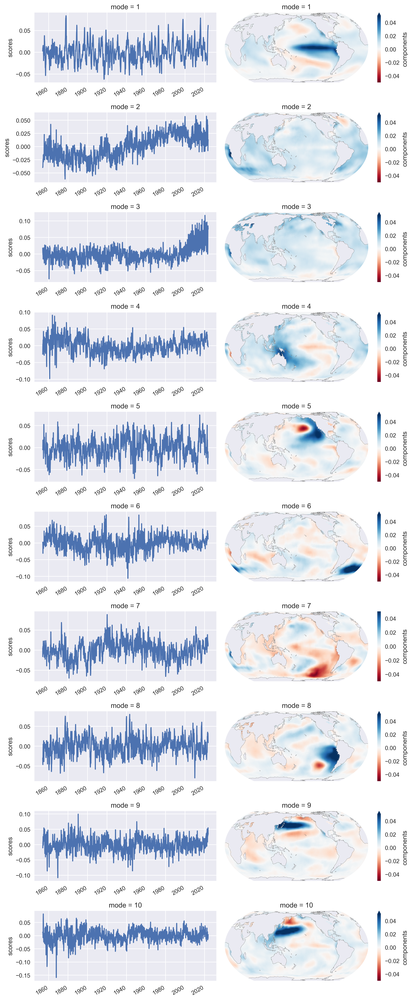

In [8]:
initial_mode=1

proj = EqualEarth(central_longitude=180)
kwargs = {"cmap": "RdBu", "vmin": -0.05, "vmax": 0.05, "transform": PlateCarree()}

fig = plt.figure(figsize=(10, 24), dpi=300)
gs = GridSpec(10, 2, width_ratios=[1, 1])
ax0 = [fig.add_subplot(gs[i, 0]) for i in range(10)]
ax1 = [fig.add_subplot(gs[i, 1], projection=proj) for i in range(10)]

for i, (a0, a1) in enumerate(zip(ax0, ax1)):
    rscores.sel(mode=i + initial_mode).plot(ax=a0)
    a1.coastlines(color=".5")
    rcomponents.sel(mode=i + initial_mode).plot(ax=a1, **kwargs)

    a0.set_xlabel("")

plt.tight_layout()

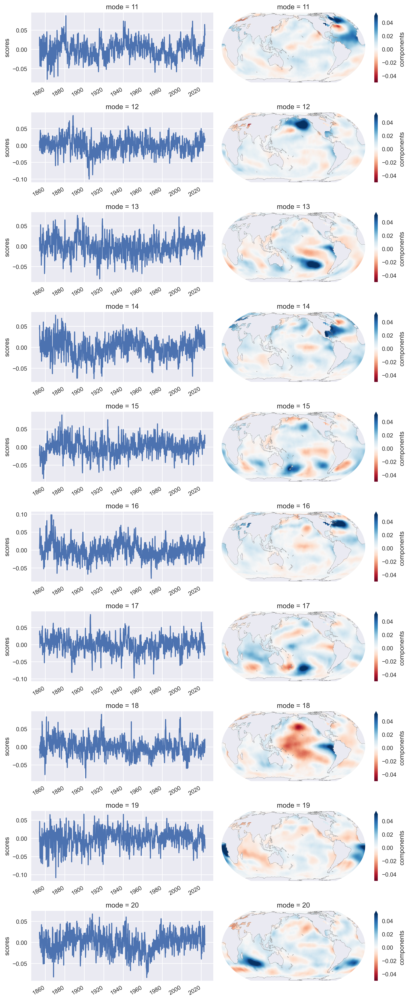

In [9]:
initial_mode=11

proj = EqualEarth(central_longitude=180)
kwargs = {"cmap": "RdBu", "vmin": -0.05, "vmax": 0.05, "transform": PlateCarree()}

fig = plt.figure(figsize=(10, 24), dpi=300)
gs = GridSpec(10, 2, width_ratios=[1, 1])
ax0 = [fig.add_subplot(gs[i, 0]) for i in range(10)]
ax1 = [fig.add_subplot(gs[i, 1], projection=proj) for i in range(10)]

for i, (a0, a1) in enumerate(zip(ax0, ax1)):
    rscores.sel(mode=i + initial_mode).plot(ax=a0)
    a1.coastlines(color=".5")
    rcomponents.sel(mode=i + initial_mode).plot(ax=a1, **kwargs)

    a0.set_xlabel("")

plt.tight_layout()

In [16]:
sst_temporal_data, sst_spatial_data = modes_to_pandas(rscores=rscores, rcomponents=rcomponents, n_modes=20)

In [17]:
sst_temporal_data

,time,month,mode,scores
0,1854-01-01,1,1,0.002863
1,1854-02-01,2,1,0.009818
2,1854-03-01,3,1,0.009666
3,1854-04-01,4,1,0.011318
4,1854-05-01,5,1,0.014108
...,...,...,...,...
40755,2023-06-01,6,20,0.030805
40756,2023-07-01,7,20,-0.002399
40757,2023-08-01,8,20,-0.004815
40758,2023-09-01,9,20,-0.004181


In [18]:
sst_spatial_data

,lat,lon,mode,lon_reshape,components
0,-88.0,0.0,1,0.0,NaN
1,-88.0,2.0,1,2.0,NaN
2,-88.0,4.0,1,4.0,NaN
3,-88.0,6.0,1,6.0,NaN
4,-88.0,8.0,1,8.0,NaN
...,...,...,...,...,...
320395,88.0,350.0,20,-10.0,0.000002
320396,88.0,352.0,20,-8.0,0.000002
320397,88.0,354.0,20,-6.0,0.000002
320398,88.0,356.0,20,-4.0,0.000003


In [19]:
sst_temporal_data.to_csv('../data/processed/sst_modes20_temporal_data_noaa.csv', index=False)
sst_spatial_data.to_csv('../data/processed/sst_modes20_spatial_data_noaa.csv', index=False)

<br>
<br>
<br>
<br>
<br>
<br>

# Air temperature anomaly EOF analysis

In [20]:
fp = '../data/air.2m.mon.mean.nc'
at = xr.open_dataset(fp)

In [21]:
at

<xarray.Dataset>
Dimensions:    (level: 1, lat: 94, lon: 192, time: 545, nbnds: 2)
Coordinates:
  * level      (level) float32 2.0
  * lat        (lat) float32 88.54 86.65 84.75 82.85 ... -84.75 -86.65 -88.54
  * lon        (lon) float32 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * time       (time) datetime64[ns] 1979-01-01 1979-02-01 ... 2024-05-01
Dimensions without coordinates: nbnds
Data variables:
    time_bnds  (time, nbnds) datetime64[ns] ...
    air        (time, level, lat, lon) float32 ...
Attributes:
    Conventions:    CF-1.0
    title:          Monthly NCEP/DOE Reanalysis 2
    comments:       Data is from \nNCEP/DOE AMIP-II Reanalysis (Reanalysis-2)...
    platform:       Model
    source:         NCEP/DOE AMIP-II Reanalysis (Reanalysis-2) Model
    institution:    National Centers for Environmental Prediction
    dataset_title:  NCEP-DOE AMIP-II Reanalysis
    References:     https://www.psl.noaa.gov/data/gridded/data.ncep.reanalysi...
    source_url:     http://www.cpc.ncep.noaa.gov/products/wesley/reanalysis2/
    history:        created 2002/03 by Hoop (netCDF2.3)\nConverted to chunked...

In [22]:
anomaly_at = at['air']
anomaly_at = anomaly_at.groupby("time.month") - anomaly_at.groupby("time.month").mean("time")

In [23]:
eof_model_detrended = EOF(n_modes=20, standardize=False, use_coslat=True)
eof_model_detrended.fit(anomaly_at, dim="time")

# VARIMAX rotation
rotator = EOFRotator(n_modes=20)
rotator.fit(eof_model_detrended)
expvar = rotator.explained_variance()
expvar_ratio = rotator.explained_variance_ratio()
rcomponents = rotator.components()
rscores = rotator.scores()

In [24]:
print("Explained variance: ", expvar.round(0).values)
print("\nRelative: ", (expvar_ratio * 100).round(1).values)

Explained variance:  [1295. 1290. 1114. 1059.  903.  800.  737.  686.  632.  616.  608.  578.
  561.  529.  479.  445.  420.  346.  324.  302.]

Relative:  [5.6 5.6 4.9 4.6 3.9 3.5 3.2 3.  2.8 2.7 2.6 2.5 2.4 2.3 2.1 1.9 1.8 1.5
 1.4 1.3]


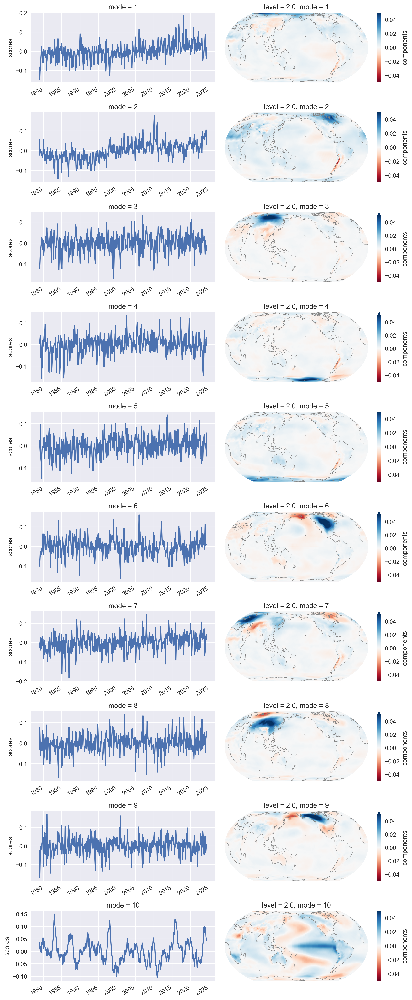

In [25]:
initial_mode=1

proj = EqualEarth(central_longitude=180)
kwargs = {"cmap": "RdBu", "vmin": -0.05, "vmax": 0.05, "transform": PlateCarree()}

fig = plt.figure(figsize=(10, 24), dpi=300)
gs = GridSpec(10, 2, width_ratios=[1, 1])
ax0 = [fig.add_subplot(gs[i, 0]) for i in range(10)]
ax1 = [fig.add_subplot(gs[i, 1], projection=proj) for i in range(10)]

for i, (a0, a1) in enumerate(zip(ax0, ax1)):
    rscores.sel(mode=i + initial_mode).plot(ax=a0)
    a1.coastlines(color=".5")
    rcomponents.sel(mode=i + initial_mode).plot(ax=a1, **kwargs)

    a0.set_xlabel("")

plt.tight_layout()

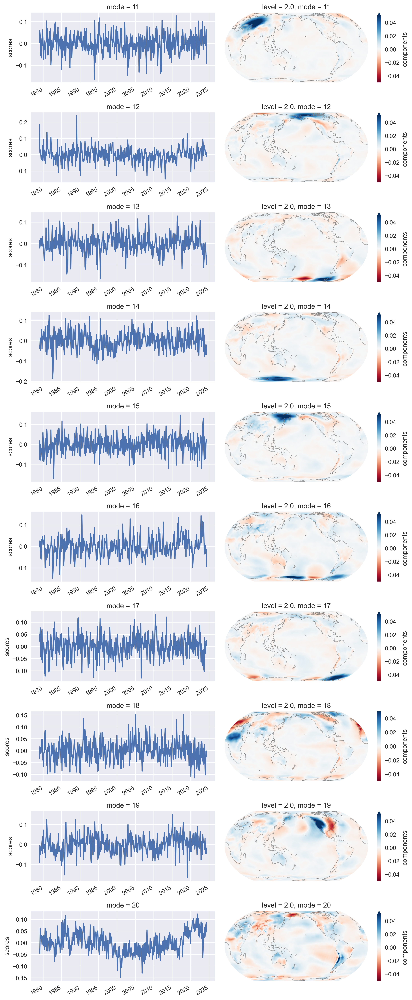

In [26]:
initial_mode=11

proj = EqualEarth(central_longitude=180)
kwargs = {"cmap": "RdBu", "vmin": -0.05, "vmax": 0.05, "transform": PlateCarree()}

fig = plt.figure(figsize=(10, 24), dpi=300)
gs = GridSpec(10, 2, width_ratios=[1, 1])
ax0 = [fig.add_subplot(gs[i, 0]) for i in range(10)]
ax1 = [fig.add_subplot(gs[i, 1], projection=proj) for i in range(10)]

for i, (a0, a1) in enumerate(zip(ax0, ax1)):
    rscores.sel(mode=i + initial_mode).plot(ax=a0)
    a1.coastlines(color=".5")
    rcomponents.sel(mode=i + initial_mode).plot(ax=a1, **kwargs)

    a0.set_xlabel("")

plt.tight_layout()

In [29]:
at_temporal_data, at_spatial_data = modes_to_pandas(rscores=rscores, rcomponents=rcomponents, n_modes=20)

In [30]:
at_temporal_data

,time,month,mode,scores
0,1979-01-01,1,1,-0.083429
1,1979-02-01,2,1,-0.145775
2,1979-03-01,3,1,-0.053714
3,1979-04-01,4,1,-0.098632
4,1979-05-01,5,1,-0.057121
...,...,...,...,...
10895,2024-01-01,1,20,0.043699
10896,2024-02-01,2,20,0.063655
10897,2024-03-01,3,20,0.078689
10898,2024-04-01,4,20,0.085688


In [31]:
at_spatial_data

,level,lat,lon,lon_reshape,mode,components
0,2.0,-88.542,0.000,0.000,1,0.000462
1,2.0,-88.542,1.875,1.875,1,0.000463
2,2.0,-88.542,3.750,3.750,1,0.000463
3,2.0,-88.542,5.625,5.625,1,0.000467
4,2.0,-88.542,7.500,7.500,1,0.000470
...,...,...,...,...,...,...
360955,2.0,88.542,350.625,-9.375,20,0.001186
360956,2.0,88.542,352.500,-7.500,20,0.001281
360957,2.0,88.542,354.375,-5.625,20,0.001270
360958,2.0,88.542,356.250,-3.750,20,0.001109


In [24]:
rcomponents.sel(mode=1).to_dataframe().reset_index()

,level,lat,lon,mode,components
0,2.0,-88.542,0.000,1,0.000467
1,2.0,-88.542,1.875,1,0.000468
2,2.0,-88.542,3.750,1,0.000469
3,2.0,-88.542,5.625,1,0.000473
4,2.0,-88.542,7.500,1,0.000475
...,...,...,...,...,...
18043,2.0,88.542,350.625,1,0.010548
18044,2.0,88.542,352.500,1,0.010561
18045,2.0,88.542,354.375,1,0.010577
18046,2.0,88.542,356.250,1,0.010582


In [32]:
at_temporal_data.to_csv('../data/processed/at_modes20_temporal_data_ncep.csv', index=False)
at_spatial_data.drop('level',axis=1).to_csv('../data/processed/at_modes20_spatial_data_ncep.csv', index=False)